### Import Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn


%matplotlib inline
sns.set_style('dark')
sns.set(font_scale=1.5)

from sklearn.model_selection import cross_val_score, train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.preprocessing import LabelEncoder, StandardScaler, MinMaxScaler, OneHotEncoder
from sklearn.metrics import confusion_matrix, classification_report, mean_absolute_error, mean_squared_error,r2_score
from sklearn.metrics import plot_confusion_matrix, plot_precision_recall_curve, plot_roc_curve, accuracy_score
from sklearn.metrics import auc, f1_score, precision_score, recall_score, roc_auc_score

import feature_engine.missing_data_imputers as mdi
from feature_engine.outlier_removers import Winsorizer

import warnings
warnings.filterwarnings('ignore')


pd.options.display.max_columns= None
pd.options.display.max_rows = None

### Data Exploration

In [2]:
df = pd.read_csv("BK.csv")

In [3]:
df.head()

,Borough,Block,Lot,CD,CT2010,CB2010,SchoolDist,Council,ZipCode,FireComp,PolicePrct,HealthCenterDistrict,HealthArea,SanitBoro,SanitDistrict,SanitSub,Address,ZoneDist1,ZoneDist2,ZoneDist3,ZoneDist4,Overlay1,Overlay2,SPDist1,SPDist2,SPDist3,LtdHeight,SplitZone,BldgClass,LandUse,Easements,OwnerType,OwnerName,LotArea,BldgArea,ComArea,ResArea,OfficeArea,RetailArea,GarageArea,StrgeArea,FactryArea,OtherArea,AreaSource,NumBldgs,NumFloors,UnitsRes,UnitsTotal,LotFront,LotDepth,BldgFront,BldgDepth,Ext,ProxCode,IrrLotCode,LotType,BsmtCode,AssessLand,AssessTot,ExemptLand,ExemptTot,YearBuilt,YearAlter1,YearAlter2,HistDist,Landmark,BuiltFAR,ResidFAR,CommFAR,FacilFAR,BoroCode,BBL,CondoNo,Tract2010,XCoord,YCoord,ZoneMap,ZMCode,Sanborn,TaxMap,EDesigNum,APPBBL,APPDate,PLUTOMapID,FIRM07_FLAG,PFIRM15_FLAG,Version
0,BK,1,1,302,21.0,NaN,13.0,33.0,11201.0,L118,84.0,36.0,1000.0,3.0,2.0,1B,JOHN STREET,M3-1,M1-4/R8A,NaN,NaN,NaN,NaN,MX-2,NaN,NaN,NaN,Y,V1,11.0,1,P,BROOKLYN BRIDGE PARK,151930,0,0,0,0,0,0,0,0,0,4,0,0.0,0,0,206.25,337.42,0.0,0.0,NaN,0.0,Y,5.0,5.0,1127700,1127700,0,0,0,0,0,DUMBO Historic District,NaN,0.00,0.0,2.0,0.0,3,3000010001,0,21,NaN,NaN,12d,NaN,302 007,30101.0,NaN,3.000010e+09,11/26/2013,1,1.0,1.0,18V1
1,BK,1,50,302,21.0,2000.0,13.0,33.0,11201.0,L118,84.0,36.0,1000.0,3.0,2.0,1B,10 JAY STREET,M1-4/R8A,M3-1,NaN,NaN,NaN,NaN,MX-2,NaN,NaN,NaN,Y,O6,5.0,0,NaN,SAFDI PLAZA PROPERTY,19682,163894,163894,0,147505,16389,0,0,0,0,2,1,10.0,0,2,109.08,207.25,88.0,195.0,NaN,1.0,Y,3.0,0.0,834300,13780800,0,0,1920,1994,2015,DUMBO Historic District,NaN,8.33,5.4,2.0,6.5,3,3000010050,0,21,987838.0,195989.0,12d,NaN,302 007,30101.0,E-231,0.000000e+00,NaN,1,1.0,1.0,18V1
2,BK,1,7501,302,21.0,2000.0,13.0,33.0,11201.0,L118,84.0,36.0,1000.0,1.0,2.0,NaN,1 JOHN STREET,M3-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,RM,4.0,1,NaN,NaN,0,102534,4686,97848,0,4686,0,0,0,0,7,1,12.0,42,44,0.00,0.00,0.0,0.0,NaN,0.0,N,0.0,5.0,389688,12347546,0,0,0,0,0,NaN,NaN,0.00,0.0,2.0,0.0,3,3000017501,3819,21,987624.0,195992.0,12d,NaN,302 007,30101.0,NaN,3.000010e+09,03/04/2016,1,1.0,1.0,18V1
3,BK,3,1,302,21.0,3002.0,13.0,33.0,11201.0,L118,84.0,36.0,1000.0,3.0,2.0,1B,JAY STREET,M3-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,U4,7.0,1,NaN,CONSOLIDED EDISON CO/,387060,0,0,0,0,0,0,0,0,0,7,15,0.0,0,0,1051.00,469.00,0.0,0.0,NaN,0.0,Y,5.0,0.0,0,0,0,0,0,0,0,NaN,NaN,0.00,0.0,2.0,0.0,3,3000030001,0,21,988568.0,196151.0,12d,NaN,302 007,30101.0,NaN,0.000000e+00,NaN,1,1.0,1.0,18V1
4,BK,3,5,302,21.0,NaN,13.0,33.0,11201.0,L118,84.0,36.0,1000.0,3.0,2.0,1B,JAY STREET,M3-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,T2,7.0,0,C,NYC DSBS,6384,0,0,0,0,0,0,0,0,0,7,0,0.0,0,0,0.00,0.00,0.0,0.0,NaN,0.0,N,8.0,5.0,22050,22050,22050,22050,0,0,0,DUMBO Historic District,NaN,0.00,0.0,2.0,0.0,3,3000030005,0,21,NaN,NaN,12d,NaN,302 007,30101.0,NaN,0.000000e+00,NaN,4,1.0,1.0,18V1


In [4]:
df = df[['Address', 'BldgArea', 'BldgDepth', 'BuiltFAR', 'CommFAR', 'FacilFAR', 'Lot', 'LotArea', 'LotDepth', 
         'NumBldgs', 'NumFloors', 'OfficeArea', 'ResArea', 'ResidFAR', 'RetailArea', 'YearBuilt', 'YearAlter1', 
         'ZipCode', 'YCoord', 'XCoord']]

In [5]:
df.head()

,Address,BldgArea,BldgDepth,BuiltFAR,CommFAR,FacilFAR,Lot,LotArea,LotDepth,NumBldgs,NumFloors,OfficeArea,ResArea,ResidFAR,RetailArea,YearBuilt,YearAlter1,ZipCode,YCoord,XCoord
0,JOHN STREET,0,0.0,0.00,2.0,0.0,1,151930,337.42,0,0.0,0,0,0.0,0,0,0,11201.0,NaN,NaN
1,10 JAY STREET,163894,195.0,8.33,2.0,6.5,50,19682,207.25,1,10.0,147505,0,5.4,16389,1920,1994,11201.0,195989.0,987838.0
2,1 JOHN STREET,102534,0.0,0.00,2.0,0.0,7501,0,0.00,1,12.0,0,97848,0.0,4686,0,0,11201.0,195992.0,987624.0
3,JAY STREET,0,0.0,0.00,2.0,0.0,1,387060,469.00,15,0.0,0,0,0.0,0,0,0,11201.0,196151.0,988568.0
4,JAY STREET,0,0.0,0.00,2.0,0.0,5,6384,0.00,0,0.0,0,0,0.0,0,0,0,11201.0,NaN,NaN


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 277316 entries, 0 to 277315
Data columns (total 20 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   Address     277133 non-null  object 
 1   BldgArea    277316 non-null  int64  
 2   BldgDepth   277316 non-null  float64
 3   BuiltFAR    277316 non-null  float64
 4   CommFAR     277316 non-null  float64
 5   FacilFAR    277316 non-null  float64
 6   Lot         277316 non-null  int64  
 7   LotArea     277316 non-null  int64  
 8   LotDepth    277316 non-null  float64
 9   NumBldgs    277316 non-null  int64  
 10  NumFloors   277316 non-null  float64
 11  OfficeArea  277316 non-null  int64  
 12  ResArea     277316 non-null  int64  
 13  ResidFAR    277316 non-null  float64
 14  RetailArea  277316 non-null  int64  
 15  YearBuilt   277316 non-null  int64  
 16  YearAlter1  277316 non-null  int64  
 17  ZipCode     276681 non-null  float64
 18  YCoord      273933 non-null  float64
 19  XC

In [7]:
df.describe(include='all')

,Address,BldgArea,BldgDepth,BuiltFAR,CommFAR,FacilFAR,Lot,LotArea,LotDepth,NumBldgs,NumFloors,OfficeArea,ResArea,ResidFAR,RetailArea,YearBuilt,YearAlter1,ZipCode,YCoord,XCoord
count,277133,2.773160e+05,277316.000000,277316.000000,277316.000000,277316.000000,277316.000000,2.773160e+05,277316.000000,277316.000000,277316.000000,2.773160e+05,2.773160e+05,277316.000000,2.773160e+05,277316.000000,277316.000000,276681.000000,273933.000000,2.739330e+05
unique,272138,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,ATLANTIC AVENUE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,52,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,5.246234e+03,49.874767,1.261117,0.145298,2.635642,162.489269,6.030870e+03,100.376143,1.218282,2.314983,3.049727e+02,3.571994e+03,1.610174,2.539208e+02,1846.336930,202.088469,11220.414676,175051.393454,9.972827e+05
std,NaN,5.477741e+04,36.559474,13.582069,0.679737,1.339575,899.265805,4.298678e+05,49.480906,0.929550,1.236835,8.135714e+03,1.872653e+04,0.966177,3.767279e+03,398.560343,603.102002,11.215144,12933.572878,1.084696e+04
min,NaN,0.000000e+00,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000,11201.000000,147054.000000,9.730170e+05
25%,NaN,1.654000e+03,38.000000,0.710000,0.000000,2.000000,19.000000,1.900000e+03,99.830000,1.000000,2.000000,0.000000e+00,1.287000e+03,0.900000,0.000000e+00,1910.000000,0.000000,11210.000000,164840.000000,9.886970e+05
50%,NaN,2.384000e+03,46.670000,1.030000,0.000000,2.000000,38.000000,2.133000e+03,100.000000,1.000000,2.000000,0.000000e+00,1.920000e+03,1.250000,0.000000e+00,1925.000000,0.000000,11220.000000,173624.000000,9.977450e+05
75%,NaN,3.342000e+03,57.000000,1.530000,0.000000,3.000000,61.000000,2.828000e+03,100.000000,1.000000,3.000000,0.000000e+00,2.684250e+03,2.430000,0.000000e+00,1938.000000,0.000000,11230.000000,185848.000000,1.004974e+06


In [8]:
df.shape

(277316, 20)

In [9]:
df.columns

Index(['Address', 'BldgArea', 'BldgDepth', 'BuiltFAR', 'CommFAR', 'FacilFAR',
       'Lot', 'LotArea', 'LotDepth', 'NumBldgs', 'NumFloors', 'OfficeArea',
       'ResArea', 'ResidFAR', 'RetailArea', 'YearBuilt', 'YearAlter1',
       'ZipCode', 'YCoord', 'XCoord'],
      dtype='object')

### Replace zero value with NaNs

In [10]:
df['Address'].value_counts()

ATLANTIC AVENUE                52
FULTON STREET                  44
BROADWAY                       40
LINDEN BOULEVARD               39
GLENMORE AVENUE                36
CONEY ISLAND AVENUE            33
DEAN STREET                    32
PACIFIC STREET                 31
EAST 94 STREET                 30
GATES AVENUE                   28
BERGEN STREET                  28
SHORE PARKWAY                  27
EASTERN PARKWAY                27
UNION STREET                   27
PROSPECT PLACE                 27
UTICA AVENUE                   26
SURF AVENUE                    26
LIVONIA AVENUE                 26
FLATLANDS AVENUE               25
HAMILTON AVENUE                25
DREW STREET                    25
PRESIDENT STREET               23
AVENUE Z                       23
AMBER STREET                   23
CARROLL STREET                 23
NEPTUNE AVENUE                 22
STILLWELL AVENUE               22
KINGS HIGHWAY                  22
57 STREET                      21
FLATBUSH AVENU

In [11]:
df['BldgArea'].value_counts()

0           11519
2400         3192
3000         3124
2700         2409
3600         2275
2000         2265
3300         2230
2160         2165
1800         1828
2200         1555
2080         1510
1440         1465
1600         1409
1116         1374
2280         1374
2520         1346
1920         1327
3200         1316
3120         1298
2480         1257
2640         1226
2560         1154
4000         1124
2880         1070
2600         1044
2100         1041
1280         1009
2800         1004
2320          972
4500          968
1760          957
3360          928
2040          923
1400          899
2500          881
1344          863
1540          856
3750          845
2760          822
3240          816
1296          801
1680          789
2240          786
2720          783
4125          761
1408          758
1520          753
5000          735
1200          729
3280          714
1152          713
1560          669
3198          663
6000          648
2680          636
1890      

In [12]:
df['BldgArea'].replace(0,np.nan,inplace=True)

In [13]:
df['BldgDepth'].value_counts()

50.00      18710
45.00      18518
40.00      17462
0.00       13642
55.00      12804
60.00       9663
35.00       9035
36.00       7895
42.00       7856
52.00       7108
38.00       6809
30.00       6644
48.00       6568
46.00       5122
65.00       4806
44.00       4777
100.00      4508
32.00       4479
34.00       4018
80.00       4005
47.00       3857
70.00       3711
54.00       3434
37.00       3416
62.00       3246
53.00       3097
43.00       2900
58.00       2830
56.00       2719
33.00       2474
57.00       2364
75.00       2250
90.00       2213
39.00       2196
64.00       1875
68.00       1775
78.00       1733
49.00       1732
28.00       1668
25.00       1634
41.00       1555
31.00       1538
66.00       1496
63.00       1448
51.00       1439
67.00       1368
27.00       1082
85.00       1073
72.00       1056
20.00        906
26.00        872
59.00        847
24.00        818
76.00        754
82.00        728
69.00        649
31.33        633
95.00        581
29.00        5

In [14]:
df['BldgDepth'].replace(0.00,np.nan,inplace=True)

In [15]:
df['BuiltFAR'].value_counts()

0.00       12135
1.00        5425
1.20        3318
1.35        3213
1.50        2933
0.62        2888
0.64        2836
1.80        2834
0.70        2751
0.90        2583
0.96        2558
0.80        2552
0.72        2535
0.74        2471
0.77        2332
0.78        2313
1.02        2299
0.66        2297
0.68        2246
0.69        2240
1.05        2215
1.04        2184
1.08        2135
0.60        2133
0.98        2120
0.88        2115
1.65        2093
0.82        2078
1.26        2078
0.81        2046
0.76        2045
0.63        2042
0.99        2042
0.92        2036
0.86        2032
0.67        2032
0.83        2019
0.73        1988
0.75        1960
0.85        1954
0.58        1950
0.79        1949
0.93        1925
0.65        1924
1.06        1921
0.84        1912
1.01        1857
0.94        1853
0.59        1852
2.00        1848
0.71        1819
1.10        1797
0.56        1790
0.61        1780
0.95        1774
0.91        1725
1.28        1700
1.14        1685
1.09        16

In [16]:
df['BuiltFAR'].replace(0.00,np.nan,inplace=True)

In [17]:
df['CommFAR'].value_counts()

0.0     258286
2.0       8226
1.0       6667
3.4       1632
4.0        863
3.0        693
10.0       279
0.5        220
4.2        153
6.0        134
12.0       129
5.0         31
15.0         3
Name: CommFAR, dtype: int64

In [18]:
df['CommFAR'].replace(0.0,np.nan,inplace=True)

In [19]:
df['FacilFAR'].value_counts()

2.00     161446
4.80      58856
1.00      25735
3.00      12067
4.00       7161
2.40       6509
0.00       2549
6.50       1283
4.20        642
6.00        546
10.00       279
12.00       129
5.00         85
6.02         16
9.00          8
15.00         3
7.50          2
Name: FacilFAR, dtype: int64

In [20]:
df['FacilFAR'].replace(0.00,np.nan,inplace=True)

In [21]:
df['Lot'].value_counts()

1       6785
15      3943
18      3926
16      3923
17      3912
20      3900
21      3887
25      3860
19      3849
14      3847
24      3844
12      3811
13      3810
30      3799
6       3794
27      3792
26      3789
23      3787
22      3785
28      3761
29      3700
31      3671
32      3670
33      3615
34      3597
7       3564
35      3556
8       3533
9       3437
36      3423
11      3421
10      3375
38      3281
40      3263
37      3250
5       3249
39      3161
41      3151
50      3140
42      3133
44      3115
43      3092
3       3080
46      3048
45      3041
52      3033
4       3032
48      3011
54      2996
49      2986
47      2982
51      2976
56      2943
53      2938
55      2932
58      2896
60      2851
57      2838
59      2815
61      2740
62      2723
64      2617
63      2598
65      2519
2       2466
66      2441
67      2362
68      2353
69      2231
70      2231
71      2010
72      1948
7501    1842
73      1773
74      1622
75      1503
76      1321

In [22]:
df['LotArea'].value_counts()

2000         39829
2500         18721
1800         11335
4000          8554
3000          6998
2003          5766
1600          4770
2200          3977
1900          3354
5000          3050
2400          2765
1667          2274
2600          2180
1875          2165
2100          2046
1500          1810
6000          1653
1950          1640
1700          1623
2504          1604
2300          1589
2800          1371
2250          1307
2700          1268
1933          1156
1750          1135
0             1102
2667          1056
2050          1055
2150          1046
2900          1039
10000          998
2375           940
2450           870
2750           817
2550           791
1983           791
3500           763
2650           737
1850           718
3200           704
1440           665
3750           665
3600           658
4007           630
1200           615
3100           581
1785           581
8000           537
1967           521
1992           514
1400           495
2017        

In [23]:
df['LotArea'].replace(0,np.nan,inplace=True)

In [24]:
df['LotDepth'].value_counts()

100.00     153855
100.17      14080
80.00        7109
90.00        5875
95.00        4474
96.67        3544
75.00        3379
110.00       1791
105.00       1718
85.00        1587
120.00       1568
127.75       1550
0.00         1448
60.00        1408
45.00        1236
70.00        1112
50.00        1106
200.00       1064
150.00       1036
125.00        925
52.50         901
131.00        863
97.50         828
100.08        820
130.00        749
109.33        734
120.50        731
118.75        618
95.17         582
40.00         564
102.50        561
107.17        557
98.00         517
96.00         513
97.00         457
82.50         404
82.00         397
92.00         394
104.00        381
97.83         369
140.00        365
87.50         353
106.00        349
120.58        347
94.00         342
115.00        334
120.25        318
93.00         298
100.33        297
57.50         286
113.00        272
108.33        271
78.00         263
100.50        260
81.00         257
101.00    

In [25]:
df['LotDepth'].replace(0.00,np.nan,inplace=True)

In [26]:
df['NumBldgs'].value_counts()

1      203435
2       60261
0       10641
3        1951
4         452
5         163
6          90
7          54
8          45
9          34
10         29
12         24
11         20
15         15
13         13
14         12
19          9
16          8
18          6
22          6
17          5
24          4
41          4
32          4
21          3
31          3
20          2
45          2
29          2
23          2
54          2
26          2
92          1
78          1
60          1
50          1
48          1
39          1
42          1
142         1
38          1
30          1
28          1
27          1
236         1
Name: NumBldgs, dtype: int64

In [27]:
df['NumBldgs'].replace(0,np.nan,inplace=True)

In [28]:
df['NumFloors'].value_counts()

2.00      144313
3.00       60016
1.00       20208
4.00       15553
0.00       12021
2.50       11514
2.75        4937
6.00        2979
5.00        1875
1.50         770
1.75         678
7.00         581
3.50         517
8.00         258
1.67         181
12.00         96
9.00          96
4.50          78
3.75          76
10.00         61
13.00         45
14.00         44
11.00         43
15.00         31
16.00         26
2.25          24
2.67          24
17.00         19
1.25          18
20.00         17
24.00         15
23.00         15
19.00         12
21.00         12
4.25          11
18.00         11
3.67          10
4.75          10
3.25          10
25.00          8
22.00          7
30.00          6
6.50           5
3.33           5
31.00          5
5.50           4
4.33           4
32.00          4
28.00          4
6.25           4
33.00          4
27.00          3
2.33           3
41.00          2
37.00          2
2.70           2
40.00          2
2.95           2
35.00         

In [29]:
df['NumFloors'].replace(0.00,np.nan,inplace=True)

In [30]:
df['OfficeArea'].value_counts()

0          269577
1000          202
2000          148
1100          113
1200           93
2500           76
800            75
1500           75
1600           74
900            69
500            65
3000           61
2200           56
600            54
4000           53
2400           53
1300           51
1240           50
5000           49
1400           48
1800           46
400            46
1080           43
840            42
960            42
750            41
1280           40
720            34
1250           33
1260           32
300            31
3600           31
700            30
1040           28
1089           27
200            27
1320           27
880            25
1440           25
1120           25
625            24
1140           24
10000          23
6000           23
2250           22
4500           22
2700           21
1700           21
1900           21
1008           20
990            19
4200           19
1350           19
8000           19
1020           18
1375      

In [31]:
df['OfficeArea'].replace(0,np.nan,inplace=True)

In [32]:
df['ResArea'].value_counts()

0          29566
2000        3338
2400        2882
1800        2660
1600        2551
2200        2542
1440        2531
2160        2109
2080        2077
2700        1892
3000        1858
1280        1658
1400        1489
1520        1476
1920        1473
1296        1428
1116        1397
1260        1390
2280        1355
2520        1291
3600        1281
1152        1268
1200        1259
1360        1218
2480        1205
1680        1151
1224        1131
2640        1108
880         1099
1368        1082
2320        1081
1760        1024
2560        1019
2600        1012
1216        1001
2100         996
1344         987
1120         985
1560         948
3300         906
2760         900
1408         882
2240         880
1620         869
1320         829
2120         804
2128         760
1880         755
1840         752
2800         750
2040         738
3750         730
1332         711
1980         698
4500         694
3120         685
1900         662
1960         662
1480         6

In [33]:
df['ResArea'].replace(0,np.nan,inplace=True)

In [34]:
df['ResidFAR'].value_counts()

1.25     53256
2.43     52344
0.90     50668
2.00     40504
0.60     19727
1.35     17018
0.00     12780
3.00     12067
4.00      6810
0.50      5443
3.44      2292
1.65      1145
4.20       642
1.02       565
6.00       535
10.00      403
6.02       378
3.45       355
2.70       254
5.00        85
5.40        32
9.00         8
7.20         3
7.52         2
Name: ResidFAR, dtype: int64

In [35]:
df['ResidFAR'].replace(0.00,np.nan,inplace=True)

In [36]:
df['RetailArea'].value_counts()

0          252659
1000          954
1100          714
1200          481
1500          467
2000          419
900           371
1600          368
800           303
1800          301
1089          276
1300          260
1400          252
2500          241
1250          226
990           200
1375          200
1240          174
1040          171
4000          158
1280          144
1625          133
1700          132
960           130
1080          130
600           115
1900          115
3000          113
2400          110
880           107
5000          103
1680          102
1750          102
720            99
1140           99
1120           98
3600           93
1440           93
2200           91
1125           90
950            90
1360           88
1320           88
700            88
2250           87
1188           85
1050           84
840            84
1260           84
750            80
1640           78
1045           78
500            75
1875           74
2100           73
1020      

In [37]:
df['RetailArea'].replace(0,np.nan,inplace=True)

In [38]:
df['YearBuilt'].value_counts()

1920    30634
1930    29350
1925    28253
1910    22954
1899    19283
1931    19094
1901    14738
0       12291
1960    10951
1940     8050
1935     5911
1915     5906
1950     5586
1955     5233
1905     5208
1965     4037
1945     3765
1900     2456
1970     2452
2005     1788
2004     1669
1928     1591
1927     1279
2006     1223
2007     1149
2003     1087
2002      993
1926      963
2008      961
2000      946
2001      925
1924      907
1990      898
1975      894
1986      869
1987      804
1989      803
1985      770
1923      735
1999      696
1933      681
2009      642
1921      630
1992      624
1980      544
2016      538
2015      530
1996      526
1998      502
1997      496
1995      488
1906      461
1993      455
2013      437
2012      428
1991      426
1929      419
1922      413
1988      398
1994      367
1932      353
2014      341
2017      322
1907      321
2011      294
1914      288
2010      246
1912      236
1911      232
1963      228
1916      225
1909  

In [39]:
df['YearBuilt'].replace(0,np.nan,inplace=True)

In [40]:
df['YearAlter1'].value_counts()

0       249321
2008      2111
2009      1640
2006      1624
2007      1406
2005      1335
2004      1308
2013      1091
2015      1020
2014       965
2010       957
2012       957
2016       916
2011       842
2003       837
1999       721
2000       697
2001       680
1997       617
1998       612
2002       607
1996       518
1988       464
1995       425
1987       414
1985       399
2017       386
1989       374
1991       369
1994       354
1993       352
1986       292
1990       286
1992       280
1983       166
1982       153
1980       149
1984       147
1981       116
1958        99
1962        90
1959        83
1964        81
1961        80
1963        78
1970        72
1965        64
1972        57
1966        53
1975        53
1979        52
1971        49
1960        46
1968        46
1969        43
1957        41
1978        38
1967        37
1973        35
1976        33
1974        28
1977        19
1956        16
1954        15
1950        11
1952         7
1919      

In [41]:
df['YearAlter1'].replace(0,np.nan,inplace=True)

In [42]:
df['ZipCode'].value_counts()

11234.0    19332
11236.0    14660
11229.0    12091
11207.0    11455
11208.0    11298
11203.0    11020
11223.0    10349
11204.0     9970
11214.0     9510
11221.0     9180
11215.0     9068
11220.0     9037
11219.0     8713
11210.0     8571
11209.0     8462
11233.0     8027
11230.0     8014
11235.0     7943
11228.0     7860
11218.0     6906
11212.0     6586
11216.0     6131
11211.0     5484
11222.0     5339
11226.0     5336
11213.0     5082
11238.0     4881
11231.0     4879
11206.0     4674
11237.0     4404
11217.0     4038
11225.0     3941
11201.0     3395
11205.0     3196
11232.0     2957
11224.0     2838
11249.0     1579
11239.0      469
11416.0        4
11251.0        1
11241.0        1
Name: ZipCode, dtype: int64

In [43]:
df['YCoord'].value_counts()

174612.0    20
173307.0    20
161420.0    19
187793.0    19
188502.0    19
170556.0    19
163664.0    19
184376.0    18
187685.0    18
164423.0    18
164469.0    18
173031.0    18
171855.0    18
169334.0    18
189400.0    18
170759.0    18
171818.0    18
185837.0    18
168151.0    18
166584.0    18
171974.0    18
181529.0    18
188479.0    18
169451.0    17
171978.0    17
171882.0    17
170061.0    17
173868.0    17
174811.0    17
171925.0    17
188121.0    17
169581.0    17
164890.0    17
173118.0    17
163813.0    17
167761.0    17
164003.0    17
167708.0    17
167710.0    17
189379.0    17
188384.0    17
169411.0    17
174058.0    17
172866.0    17
188287.0    17
184640.0    17
165352.0    17
171026.0    17
164377.0    17
163031.0    17
184978.0    16
163925.0    16
164645.0    16
188166.0    16
165432.0    16
163603.0    16
164436.0    16
187953.0    16
164361.0    16
171661.0    16
168443.0    16
189373.0    16
188236.0    16
188896.0    16
184135.0    16
172650.0    16
172686.0  

In [44]:
df['XCoord'].value_counts()

996612.0     26
1000663.0    23
998837.0     23
997311.0     22
999615.0     22
999503.0     21
998044.0     21
998309.0     21
996393.0     20
996541.0     20
989065.0     20
998167.0     20
997291.0     20
1001204.0    20
999907.0     20
996563.0     20
999580.0     20
998647.0     20
998855.0     20
1002981.0    20
996503.0     20
1000557.0    20
997885.0     19
998552.0     19
1000679.0    19
998444.0     19
1001300.0    19
998433.0     19
998644.0     19
999640.0     19
999817.0     19
1000468.0    19
1000474.0    19
996248.0     19
999901.0     19
1001200.0    19
1000907.0    19
998810.0     19
1005061.0    19
999612.0     19
1001312.0    19
988667.0     19
999674.0     19
997378.0     19
998262.0     19
999782.0     19
998850.0     19
999468.0     19
998508.0     19
996015.0     19
1000376.0    18
995734.0     18
998869.0     18
1001576.0    18
998687.0     18
1000117.0    18
1000217.0    18
997608.0     18
996561.0     18
988584.0     18
996879.0     18
1003898.0    18
999703.0

### Treat Missing Values

In [45]:
df.isnull().sum()

Address          183
BldgArea       11519
BldgDepth      13642
BuiltFAR       12135
CommFAR       258286
FacilFAR        2549
Lot                0
LotArea         1102
LotDepth        1448
NumBldgs       10641
NumFloors      12021
OfficeArea    269577
ResArea        29566
ResidFAR       12780
RetailArea    252659
YearBuilt      12291
YearAlter1    249321
ZipCode          635
YCoord          3383
XCoord          3383
dtype: int64

In [46]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 277316 entries, 0 to 277315
Data columns (total 20 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   Address     277133 non-null  object 
 1   BldgArea    265797 non-null  float64
 2   BldgDepth   263674 non-null  float64
 3   BuiltFAR    265181 non-null  float64
 4   CommFAR     19030 non-null   float64
 5   FacilFAR    274767 non-null  float64
 6   Lot         277316 non-null  int64  
 7   LotArea     276214 non-null  float64
 8   LotDepth    275868 non-null  float64
 9   NumBldgs    266675 non-null  float64
 10  NumFloors   265295 non-null  float64
 11  OfficeArea  7739 non-null    float64
 12  ResArea     247750 non-null  float64
 13  ResidFAR    264536 non-null  float64
 14  RetailArea  24657 non-null   float64
 15  YearBuilt   265025 non-null  float64
 16  YearAlter1  27995 non-null   float64
 17  ZipCode     276681 non-null  float64
 18  YCoord      273933 non-null  float64
 19  XC

In [47]:
imputer = mdi.MeanMedianImputer(imputation_method='median',variables=None)

In [48]:
imputer.fit(df)

MeanMedianImputer(imputation_method='median',
                  variables=['BldgArea', 'BldgDepth', 'BuiltFAR', 'CommFAR',
                             'FacilFAR', 'Lot', 'LotArea', 'LotDepth',
                             'NumBldgs', 'NumFloors', 'OfficeArea', 'ResArea',
                             'ResidFAR', 'RetailArea', 'YearBuilt',
                             'YearAlter1', 'ZipCode', 'YCoord', 'XCoord'])

In [49]:
df = imputer.transform(df)

In [50]:
df.isnull().sum()

Address       183
BldgArea        0
BldgDepth       0
BuiltFAR        0
CommFAR         0
FacilFAR        0
Lot             0
LotArea         0
LotDepth        0
NumBldgs        0
NumFloors       0
OfficeArea      0
ResArea         0
ResidFAR        0
RetailArea      0
YearBuilt       0
YearAlter1      0
ZipCode         0
YCoord          0
XCoord          0
dtype: int64

### Change data type

In [51]:
df.dtypes

Address        object
BldgArea      float64
BldgDepth     float64
BuiltFAR      float64
CommFAR       float64
FacilFAR      float64
Lot             int64
LotArea       float64
LotDepth      float64
NumBldgs      float64
NumFloors     float64
OfficeArea    float64
ResArea       float64
ResidFAR      float64
RetailArea    float64
YearBuilt     float64
YearAlter1    float64
ZipCode       float64
YCoord        float64
XCoord        float64
dtype: object

### Load 311 dataset

In [52]:
df2 = pd.read_csv("allcomplaints.csv")

In [53]:
df2.head()

,ComplaintType,Zipcode,Street,Borough
0,HEAT/HOT WATER,10019.0,WEST 52 STREET,MANHATTAN
1,UNSANITARY CONDITION,11204.0,67 STREET,BROOKLYN
2,HEAT/HOT WATER,11372.0,37 AVENUE,QUEENS
3,HEAT/HOT WATER,10458.0,SOUTHERN BOULEVARD,BRONX
4,APPLIANCE,11209.0,78 STREET,BROOKLYN


In [54]:
df2.shape

(5119327, 4)

In [55]:
df2['Borough'].value_counts()

BROOKLYN         1731202
BRONX            1609837
MANHATTAN        1049360
QUEENS            641741
STATEN ISLAND      87187
Name: Borough, dtype: int64

In [56]:
df3 = df2[df2['Borough'] == 'BROOKLYN']

In [57]:
df3.head()

,ComplaintType,Zipcode,Street,Borough
1,UNSANITARY CONDITION,11204.0,67 STREET,BROOKLYN
4,APPLIANCE,11209.0,78 STREET,BROOKLYN
6,GENERAL,11226.0,LENOX ROAD,BROOKLYN
8,ELECTRIC,11230.0,OCEAN PARKWAY,BROOKLYN
9,HEAT/HOT WATER,11207.0,WYONA STREET,BROOKLYN


In [58]:
df3.shape

(1731202, 4)

In [59]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1731202 entries, 1 to 5119313
Data columns (total 4 columns):
 #   Column         Dtype  
---  ------         -----  
 0   ComplaintType  object 
 1   Zipcode        float64
 2   Street         object 
 3   Borough        object 
dtypes: float64(1), object(3)
memory usage: 66.0+ MB


In [60]:
df3.head()

,ComplaintType,Zipcode,Street,Borough
1,UNSANITARY CONDITION,11204.0,67 STREET,BROOKLYN
4,APPLIANCE,11209.0,78 STREET,BROOKLYN
6,GENERAL,11226.0,LENOX ROAD,BROOKLYN
8,ELECTRIC,11230.0,OCEAN PARKWAY,BROOKLYN
9,HEAT/HOT WATER,11207.0,WYONA STREET,BROOKLYN


In [61]:
df3.reset_index(drop=True,inplace=True)

In [62]:
df3.head()

,ComplaintType,Zipcode,Street,Borough
0,UNSANITARY CONDITION,11204.0,67 STREET,BROOKLYN
1,APPLIANCE,11209.0,78 STREET,BROOKLYN
2,GENERAL,11226.0,LENOX ROAD,BROOKLYN
3,ELECTRIC,11230.0,OCEAN PARKWAY,BROOKLYN
4,HEAT/HOT WATER,11207.0,WYONA STREET,BROOKLYN


In [63]:
df.shape

(277316, 20)

In [64]:
df4 = df3.sample(n=277316, random_state=0)

In [65]:
df4.head()

,ComplaintType,Zipcode,Street,Borough
735557,UNSANITARY CONDITION,11203.0,CLARKSON AVENUE,BROOKLYN
1704798,ELECTRIC,11208.0,BELMONT AVENUE,BROOKLYN
1427450,HEAT/HOT WATER,11208.0,LINCOLN AVENUE,BROOKLYN
159009,PAINT/PLASTER,11211.0,SOUTH 3 STREET,BROOKLYN
572205,PLUMBING,11216.0,HANCOCK STREET,BROOKLYN


In [66]:
df4.reset_index(drop=True,inplace=True)

In [67]:
df4.head()

,ComplaintType,Zipcode,Street,Borough
0,UNSANITARY CONDITION,11203.0,CLARKSON AVENUE,BROOKLYN
1,ELECTRIC,11208.0,BELMONT AVENUE,BROOKLYN
2,HEAT/HOT WATER,11208.0,LINCOLN AVENUE,BROOKLYN
3,PAINT/PLASTER,11211.0,SOUTH 3 STREET,BROOKLYN
4,PLUMBING,11216.0,HANCOCK STREET,BROOKLYN


In [68]:
df5 = pd.concat([df,df4],axis=1)

In [69]:
df5.head()

,Address,BldgArea,BldgDepth,BuiltFAR,CommFAR,FacilFAR,Lot,LotArea,LotDepth,NumBldgs,NumFloors,OfficeArea,ResArea,ResidFAR,RetailArea,YearBuilt,YearAlter1,ZipCode,YCoord,XCoord,ComplaintType,Zipcode,Street,Borough
0,JOHN STREET,2430.0,48.0,1.06,2.0,2.0,1,151930.0,337.42,1.0,2.0,1802.0,2060.0,1.35,1375.0,1925.0,2005.0,11201.0,173624.0,997745.0,UNSANITARY CONDITION,11203.0,CLARKSON AVENUE,BROOKLYN
1,10 JAY STREET,163894.0,195.0,8.33,2.0,6.5,50,19682.0,207.25,1.0,10.0,147505.0,2060.0,5.40,16389.0,1920.0,1994.0,11201.0,195989.0,987838.0,ELECTRIC,11208.0,BELMONT AVENUE,BROOKLYN
2,1 JOHN STREET,102534.0,48.0,1.06,2.0,2.0,7501,2142.0,100.00,1.0,12.0,1802.0,97848.0,1.35,4686.0,1925.0,2005.0,11201.0,195992.0,987624.0,HEAT/HOT WATER,11208.0,LINCOLN AVENUE,BROOKLYN
3,JAY STREET,2430.0,48.0,1.06,2.0,2.0,1,387060.0,469.00,15.0,2.0,1802.0,2060.0,1.35,1375.0,1925.0,2005.0,11201.0,196151.0,988568.0,PAINT/PLASTER,11211.0,SOUTH 3 STREET,BROOKLYN
4,JAY STREET,2430.0,48.0,1.06,2.0,2.0,5,6384.0,100.00,1.0,2.0,1802.0,2060.0,1.35,1375.0,1925.0,2005.0,11201.0,173624.0,997745.0,PLUMBING,11216.0,HANCOCK STREET,BROOKLYN


In [70]:
df5.shape

(277316, 24)

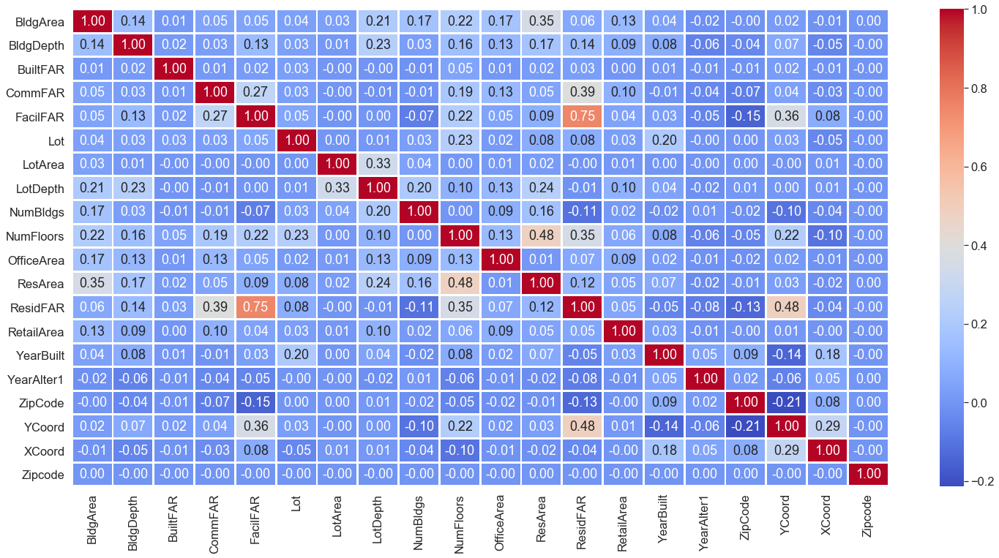

In [71]:
plt.figure(figsize=(25,12))
sns.heatmap(df5.corr(),cmap="coolwarm",annot=True,fmt='.2f',linewidths=2)
plt.show()

### Treat Duplicate Values

In [72]:
df5.duplicated(keep='first').sum()

0

### Feature Engineering

In [73]:
df5['Age'] = df5['YearAlter1'] - df5['YearBuilt']

In [74]:
df5.head()

,Address,BldgArea,BldgDepth,BuiltFAR,CommFAR,FacilFAR,Lot,LotArea,LotDepth,NumBldgs,NumFloors,OfficeArea,ResArea,ResidFAR,RetailArea,YearBuilt,YearAlter1,ZipCode,YCoord,XCoord,ComplaintType,Zipcode,Street,Borough,Age
0,JOHN STREET,2430.0,48.0,1.06,2.0,2.0,1,151930.0,337.42,1.0,2.0,1802.0,2060.0,1.35,1375.0,1925.0,2005.0,11201.0,173624.0,997745.0,UNSANITARY CONDITION,11203.0,CLARKSON AVENUE,BROOKLYN,80.0
1,10 JAY STREET,163894.0,195.0,8.33,2.0,6.5,50,19682.0,207.25,1.0,10.0,147505.0,2060.0,5.40,16389.0,1920.0,1994.0,11201.0,195989.0,987838.0,ELECTRIC,11208.0,BELMONT AVENUE,BROOKLYN,74.0
2,1 JOHN STREET,102534.0,48.0,1.06,2.0,2.0,7501,2142.0,100.00,1.0,12.0,1802.0,97848.0,1.35,4686.0,1925.0,2005.0,11201.0,195992.0,987624.0,HEAT/HOT WATER,11208.0,LINCOLN AVENUE,BROOKLYN,80.0
3,JAY STREET,2430.0,48.0,1.06,2.0,2.0,1,387060.0,469.00,15.0,2.0,1802.0,2060.0,1.35,1375.0,1925.0,2005.0,11201.0,196151.0,988568.0,PAINT/PLASTER,11211.0,SOUTH 3 STREET,BROOKLYN,80.0
4,JAY STREET,2430.0,48.0,1.06,2.0,2.0,5,6384.0,100.00,1.0,2.0,1802.0,2060.0,1.35,1375.0,1925.0,2005.0,11201.0,173624.0,997745.0,PLUMBING,11216.0,HANCOCK STREET,BROOKLYN,80.0


In [75]:
df5['Period'] = 2020 - df5['YearBuilt']

In [76]:
df5.head()

,Address,BldgArea,BldgDepth,BuiltFAR,CommFAR,FacilFAR,Lot,LotArea,LotDepth,NumBldgs,NumFloors,OfficeArea,ResArea,ResidFAR,RetailArea,YearBuilt,YearAlter1,ZipCode,YCoord,XCoord,ComplaintType,Zipcode,Street,Borough,Age,Period
0,JOHN STREET,2430.0,48.0,1.06,2.0,2.0,1,151930.0,337.42,1.0,2.0,1802.0,2060.0,1.35,1375.0,1925.0,2005.0,11201.0,173624.0,997745.0,UNSANITARY CONDITION,11203.0,CLARKSON AVENUE,BROOKLYN,80.0,95.0
1,10 JAY STREET,163894.0,195.0,8.33,2.0,6.5,50,19682.0,207.25,1.0,10.0,147505.0,2060.0,5.40,16389.0,1920.0,1994.0,11201.0,195989.0,987838.0,ELECTRIC,11208.0,BELMONT AVENUE,BROOKLYN,74.0,100.0
2,1 JOHN STREET,102534.0,48.0,1.06,2.0,2.0,7501,2142.0,100.00,1.0,12.0,1802.0,97848.0,1.35,4686.0,1925.0,2005.0,11201.0,195992.0,987624.0,HEAT/HOT WATER,11208.0,LINCOLN AVENUE,BROOKLYN,80.0,95.0
3,JAY STREET,2430.0,48.0,1.06,2.0,2.0,1,387060.0,469.00,15.0,2.0,1802.0,2060.0,1.35,1375.0,1925.0,2005.0,11201.0,196151.0,988568.0,PAINT/PLASTER,11211.0,SOUTH 3 STREET,BROOKLYN,80.0,95.0
4,JAY STREET,2430.0,48.0,1.06,2.0,2.0,5,6384.0,100.00,1.0,2.0,1802.0,2060.0,1.35,1375.0,1925.0,2005.0,11201.0,173624.0,997745.0,PLUMBING,11216.0,HANCOCK STREET,BROOKLYN,80.0,95.0


### Drop unwanted features

In [77]:
df5.columns

Index(['Address', 'BldgArea', 'BldgDepth', 'BuiltFAR', 'CommFAR', 'FacilFAR',
       'Lot', 'LotArea', 'LotDepth', 'NumBldgs', 'NumFloors', 'OfficeArea',
       'ResArea', 'ResidFAR', 'RetailArea', 'YearBuilt', 'YearAlter1',
       'ZipCode', 'YCoord', 'XCoord', 'ComplaintType', 'Zipcode', 'Street',
       'Borough', 'Age', 'Period'],
      dtype='object')

In [78]:
df5.drop(['Zipcode', 'Street', 'Borough', 'Address','Lot','YearBuilt', 'YearAlter1', 
          'ZipCode','YCoord', 'XCoord'],axis=1,inplace=True)

In [79]:
df5.head()

,BldgArea,BldgDepth,BuiltFAR,CommFAR,FacilFAR,LotArea,LotDepth,NumBldgs,NumFloors,OfficeArea,ResArea,ResidFAR,RetailArea,ComplaintType,Age,Period
0,2430.0,48.0,1.06,2.0,2.0,151930.0,337.42,1.0,2.0,1802.0,2060.0,1.35,1375.0,UNSANITARY CONDITION,80.0,95.0
1,163894.0,195.0,8.33,2.0,6.5,19682.0,207.25,1.0,10.0,147505.0,2060.0,5.40,16389.0,ELECTRIC,74.0,100.0
2,102534.0,48.0,1.06,2.0,2.0,2142.0,100.00,1.0,12.0,1802.0,97848.0,1.35,4686.0,HEAT/HOT WATER,80.0,95.0
3,2430.0,48.0,1.06,2.0,2.0,387060.0,469.00,15.0,2.0,1802.0,2060.0,1.35,1375.0,PAINT/PLASTER,80.0,95.0
4,2430.0,48.0,1.06,2.0,2.0,6384.0,100.00,1.0,2.0,1802.0,2060.0,1.35,1375.0,PLUMBING,80.0,95.0


### Treat Outliers

In [80]:
df5.columns

Index(['BldgArea', 'BldgDepth', 'BuiltFAR', 'CommFAR', 'FacilFAR', 'LotArea',
       'LotDepth', 'NumBldgs', 'NumFloors', 'OfficeArea', 'ResArea',
       'ResidFAR', 'RetailArea', 'ComplaintType', 'Age', 'Period'],
      dtype='object')

In [81]:
df5.describe(include='all')

,BldgArea,BldgDepth,BuiltFAR,CommFAR,FacilFAR,LotArea,LotDepth,NumBldgs,NumFloors,OfficeArea,ResArea,ResidFAR,RetailArea,ComplaintType,Age,Period
count,2.773160e+05,277316.000000,277316.000000,277316.000000,277316.000000,2.773160e+05,277316.000000,277316.000000,277316.000000,2.773160e+05,2.773160e+05,277316.000000,2.773160e+05,277316,277316.000000,277316.000000
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16,NaN,NaN
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,HEAT/HOT WATER,NaN,NaN
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,91254,NaN,NaN
mean,5.347170e+03,52.236030,1.307501,2.008054,2.654025,6.039382e+03,100.898291,1.256653,2.401678,2.056685e+03,3.791621e+03,1.672389,1.506665e+03,NaN,73.028689,88.344607
std,5.476989e+04,34.768159,13.579493,0.419982,1.316809,4.298677e+05,48.943637,0.898592,1.137646,8.075239e+03,1.869540e+04,0.901812,3.702614e+03,NaN,27.595299,27.483067
min,1.000000e+00,0.830000,0.010000,0.500000,1.000000,1.000000e+00,0.180000,1.000000,1.000000,4.000000e+01,1.000000e+02,0.500000,1.000000e+01,NaN,-61.000000,2.000000
25%,1.795000e+03,40.000000,0.760000,2.000000,2.000000,1.903000e+03,100.000000,1.000000,2.000000,1.802000e+03,1.516000e+03,0.900000,1.375000e+03,NaN,65.000000,82.000000
50%,2.430000e+03,48.000000,1.060000,2.000000,2.000000,2.142000e+03,100.000000,1.000000,2.000000,1.802000e+03,2.060000e+03,1.350000,1.375000e+03,NaN,80.000000,95.000000
75%,3.342000e+03,57.000000,1.530000,2.000000,3.000000,2.828000e+03,100.000000,1.000000,3.000000,1.802000e+03,2.684250e+03,2.430000,1.375000e+03,NaN,90.000000,105.000000


In [82]:
windsorizer = Winsorizer(distribution='skewed',tail='right',fold=3.0,
                         variables=None)

In [83]:
windsorizer.fit(df5)

Winsorizer(distribution='skewed', fold=3.0, tail='right',
           variables=['BldgArea', 'BldgDepth', 'BuiltFAR', 'CommFAR',
                      'FacilFAR', 'LotArea', 'LotDepth', 'NumBldgs',
                      'NumFloors', 'OfficeArea', 'ResArea', 'ResidFAR',
                      'RetailArea', 'Age', 'Period'])

In [84]:
df6 = windsorizer.transform(df5)

In [85]:
df6.head()

,BldgArea,BldgDepth,BuiltFAR,CommFAR,FacilFAR,LotArea,LotDepth,NumBldgs,NumFloors,OfficeArea,ResArea,ResidFAR,RetailArea,ComplaintType,Age,Period
0,2430.0,48.0,1.06,2.0,2.0,5603.0,100.0,1.0,2.0,1802.0,2060.0,1.35,1375.0,UNSANITARY CONDITION,80.0,95.0
1,7983.0,108.0,3.84,2.0,6.0,5603.0,100.0,1.0,6.0,1802.0,2060.0,5.40,1375.0,ELECTRIC,74.0,100.0
2,7983.0,48.0,1.06,2.0,2.0,2142.0,100.0,1.0,6.0,1802.0,6189.0,1.35,1375.0,HEAT/HOT WATER,80.0,95.0
3,2430.0,48.0,1.06,2.0,2.0,5603.0,100.0,1.0,2.0,1802.0,2060.0,1.35,1375.0,PAINT/PLASTER,80.0,95.0
4,2430.0,48.0,1.06,2.0,2.0,5603.0,100.0,1.0,2.0,1802.0,2060.0,1.35,1375.0,PLUMBING,80.0,95.0


In [86]:
df6.describe()

,BldgArea,BldgDepth,BuiltFAR,CommFAR,FacilFAR,LotArea,LotDepth,NumBldgs,NumFloors,OfficeArea,ResArea,ResidFAR,RetailArea,Age,Period
count,277316.000000,277316.000000,277316.000000,277316.000000,277316.000000,277316.000000,277316.000000,277316.0,277316.000000,277316.000000,277316.000000,277316.000000,277316.000000,277316.000000,277316.000000
mean,2955.073313,51.153042,1.251621,1.974769,2.644701,2578.739456,94.816304,1.0,2.376413,1791.398156,2378.125074,1.667995,1358.964131,73.016350,88.327698
std,1801.811420,17.233569,0.715888,0.158712,1.279198,1154.454261,12.694961,0.0,0.847489,99.869506,1294.866476,0.867893,87.471302,27.546299,27.419089
min,1.000000,0.830000,0.010000,0.500000,1.000000,1.000000,0.180000,1.0,1.000000,40.000000,100.000000,0.500000,10.000000,-61.000000,2.000000
25%,1795.000000,40.000000,0.760000,2.000000,2.000000,1903.000000,100.000000,1.0,2.000000,1802.000000,1516.000000,0.900000,1375.000000,65.000000,82.000000
50%,2430.000000,48.000000,1.060000,2.000000,2.000000,2142.000000,100.000000,1.0,2.000000,1802.000000,2060.000000,1.350000,1375.000000,80.000000,95.000000
75%,3342.000000,57.000000,1.530000,2.000000,3.000000,2828.000000,100.000000,1.0,3.000000,1802.000000,2684.250000,2.430000,1375.000000,90.000000,105.000000
max,7983.000000,108.000000,3.840000,2.000000,6.000000,5603.000000,100.000000,1.0,6.000000,1802.000000,6189.000000,7.020000,1375.000000,165.000000,174.000000


In [87]:
windsorizer.left_tail_caps_

{}

In [88]:
windsorizer.right_tail_caps_

{'BldgArea': 7983.0,
 'BldgDepth': 108.0,
 'BuiltFAR': 3.84,
 'CommFAR': 2.0,
 'FacilFAR': 6.0,
 'LotArea': 5603.0,
 'LotDepth': 100.0,
 'NumBldgs': 1.0,
 'NumFloors': 6.0,
 'OfficeArea': 1802.0,
 'ResArea': 6189.0,
 'ResidFAR': 7.020000000000001,
 'RetailArea': 1375.0,
 'Age': 165.0,
 'Period': 174.0}

### Predict top 5 311 Problems (HEAT/HOT WATER, PAINT/PLASTER, PLUMBING, UNSANITARY CONDITION ). Create a new category called Others

In [89]:
df6['ComplaintType'].value_counts()

HEAT/HOT WATER          91254
PAINT/PLASTER           33708
PLUMBING                32332
UNSANITARY CONDITION    25114
GENERAL CONSTRUCTION    21441
ELECTRIC                15943
NONCONST                11316
WATER LEAK              11265
DOOR/WINDOW             11160
GENERAL                  7676
FLOORING/STAIRS          7594
APPLIANCE                4801
SAFETY                   2975
OUTSIDE BUILDING          410
ELEVATOR                  326
MOLD                        1
Name: ComplaintType, dtype: int64

In [90]:
df6.replace(to_replace='GENERAL CONSTRUCTION',value='OTHERS',inplace=True)

In [91]:
df6.replace(to_replace='ELECTRIC',value='OTHERS',inplace=True)

In [92]:
df6.replace(to_replace='DOOR/WINDOW',value='OTHERS',inplace=True)

In [93]:
df6.replace(to_replace='WATER LEAK',value='OTHERS',inplace=True)

In [94]:
df6.replace(to_replace='NONCONST',value='OTHERS',inplace=True)

In [95]:
df6.replace(to_replace='FLOORING/STAIRS',value='OTHERS',inplace=True)

In [96]:
df6.replace(to_replace='GENERAL',value='OTHERS',inplace=True)

In [97]:
df6.replace(to_replace='APPLIANCE',value='OTHERS',inplace=True)

In [98]:
df6.replace(to_replace='SAFETY',value='OTHERS',inplace=True)

In [99]:
df6.replace(to_replace='ELEVATOR',value='OTHERS',inplace=True)

In [100]:
df6.replace(to_replace='OUTSIDE BUILDING',value='OTHERS',inplace=True)

In [101]:
df6.replace(to_replace='STRUCTURAL',value='OTHERS',inplace=True)

In [102]:
df6.replace(to_replace='VACANT APARTMENT',value='OTHERS',inplace=True)

In [103]:
df6.replace(to_replace='MOLD',value='OTHERS',inplace=True)

In [104]:
df6['ComplaintType'].value_counts()

OTHERS                  94908
HEAT/HOT WATER          91254
PAINT/PLASTER           33708
PLUMBING                32332
UNSANITARY CONDITION    25114
Name: ComplaintType, dtype: int64

In [105]:
df6.head()

,BldgArea,BldgDepth,BuiltFAR,CommFAR,FacilFAR,LotArea,LotDepth,NumBldgs,NumFloors,OfficeArea,ResArea,ResidFAR,RetailArea,ComplaintType,Age,Period
0,2430.0,48.0,1.06,2.0,2.0,5603.0,100.0,1.0,2.0,1802.0,2060.0,1.35,1375.0,UNSANITARY CONDITION,80.0,95.0
1,7983.0,108.0,3.84,2.0,6.0,5603.0,100.0,1.0,6.0,1802.0,2060.0,5.40,1375.0,OTHERS,74.0,100.0
2,7983.0,48.0,1.06,2.0,2.0,2142.0,100.0,1.0,6.0,1802.0,6189.0,1.35,1375.0,HEAT/HOT WATER,80.0,95.0
3,2430.0,48.0,1.06,2.0,2.0,5603.0,100.0,1.0,2.0,1802.0,2060.0,1.35,1375.0,PAINT/PLASTER,80.0,95.0
4,2430.0,48.0,1.06,2.0,2.0,5603.0,100.0,1.0,2.0,1802.0,2060.0,1.35,1375.0,PLUMBING,80.0,95.0


In [106]:
encoder = LabelEncoder()

In [107]:
df6['ComplaintType'] = encoder.fit_transform(df6['ComplaintType'])

In [108]:
df6['ComplaintType'].value_counts()

1    94908
0    91254
2    33708
3    32332
4    25114
Name: ComplaintType, dtype: int64

In [109]:
df6.head()

,BldgArea,BldgDepth,BuiltFAR,CommFAR,FacilFAR,LotArea,LotDepth,NumBldgs,NumFloors,OfficeArea,ResArea,ResidFAR,RetailArea,ComplaintType,Age,Period
0,2430.0,48.0,1.06,2.0,2.0,5603.0,100.0,1.0,2.0,1802.0,2060.0,1.35,1375.0,4,80.0,95.0
1,7983.0,108.0,3.84,2.0,6.0,5603.0,100.0,1.0,6.0,1802.0,2060.0,5.40,1375.0,1,74.0,100.0
2,7983.0,48.0,1.06,2.0,2.0,2142.0,100.0,1.0,6.0,1802.0,6189.0,1.35,1375.0,0,80.0,95.0
3,2430.0,48.0,1.06,2.0,2.0,5603.0,100.0,1.0,2.0,1802.0,2060.0,1.35,1375.0,2,80.0,95.0
4,2430.0,48.0,1.06,2.0,2.0,5603.0,100.0,1.0,2.0,1802.0,2060.0,1.35,1375.0,3,80.0,95.0


### HEAT/HOT WATER = 0; OTHERS = 1; PAINT/PLASTER = 2; PLUMBING = 3; UNSANITARY CONDITION = 4

In [110]:
df6.columns

Index(['BldgArea', 'BldgDepth', 'BuiltFAR', 'CommFAR', 'FacilFAR', 'LotArea',
       'LotDepth', 'NumBldgs', 'NumFloors', 'OfficeArea', 'ResArea',
       'ResidFAR', 'RetailArea', 'ComplaintType', 'Age', 'Period'],
      dtype='object')

In [111]:
df6 = df6[['BldgArea', 'BldgDepth', 'BuiltFAR', 'CommFAR',
       'FacilFAR', 'LotArea', 'LotDepth', 'NumBldgs', 'NumFloors',
       'OfficeArea', 'ResArea', 'ResidFAR', 'RetailArea', 'Age', 'Period','ComplaintType']]

In [112]:
df6.head()

,BldgArea,BldgDepth,BuiltFAR,CommFAR,FacilFAR,LotArea,LotDepth,NumBldgs,NumFloors,OfficeArea,ResArea,ResidFAR,RetailArea,Age,Period,ComplaintType
0,2430.0,48.0,1.06,2.0,2.0,5603.0,100.0,1.0,2.0,1802.0,2060.0,1.35,1375.0,80.0,95.0,4
1,7983.0,108.0,3.84,2.0,6.0,5603.0,100.0,1.0,6.0,1802.0,2060.0,5.40,1375.0,74.0,100.0,1
2,7983.0,48.0,1.06,2.0,2.0,2142.0,100.0,1.0,6.0,1802.0,6189.0,1.35,1375.0,80.0,95.0,0
3,2430.0,48.0,1.06,2.0,2.0,5603.0,100.0,1.0,2.0,1802.0,2060.0,1.35,1375.0,80.0,95.0,2
4,2430.0,48.0,1.06,2.0,2.0,5603.0,100.0,1.0,2.0,1802.0,2060.0,1.35,1375.0,80.0,95.0,3


### Create and save processed dataset

In [113]:
#df6.to_csv("brooklynclasstrain.csv",index=False)